<h1 style="background: linear-gradient(to right, #ff6b6b, #4ecdc4); 
           color: white; 
           padding: 20px; 
           border-radius: 10px; 
           text-align: center; 
           font-family: Arial, sans-serif; 
           text-shadow: 2px 2px 4px rgba(0,0,0,0.5);">
  Multimodal Embeddings and Search Retrieval
</h1>

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px;">
  <br>
  <hr>

  <p>This lab will present <b>multimodal embeddings</b> as a unified representation of multiple modalities. We will visually observe how similar and dissimilar data are represented by embeddings. We will use <b>Amazon Titan Multimodal embeddings</b> to represent image and text data. Upon analyzing the properties of multimodal embeddings on some sample data, we will implement a search and retrieval application using a product dataset. We will retrieve similar products based on text queries, input images as well as both. This enables finding related products that share conceptual and visual similarities beyond simple text matching.</p>

  <ol>
    <li>Installing dependencies</li>
    <li>Generate multimodal embeddings</li>
    <li>Load images</li>
    <li>Generate embeddings of all the images</li>
    <li>Visualize image embeddings</li>
    <li>Analyze new data using multimodal embeddings</li>
    <li>Multimodal search
      <ul>
        <li>Search using text</li>
        <li>Search using images</li>
        <li>Search using both text and images</li>
      </ul>
  </ol>

  <hr>
</div>


### Installing dependencies

In [1]:
# %%capture
# !pip install -r requirements.txt

In [2]:
import boto3
from botocore.exceptions import ClientError
import os
import json
import numpy as np
import base64
import pandas as pd
from PIL import Image
import faiss
from tqdm import tqdm
import matplotlib.pyplot as plt
from IPython import display

import logging

logger = logging.getLogger(__name__)
logging.basicConfig(level=logging.ERROR)

### Generate Multimodal Embeddings

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p><b>Multimodal embeddings</b> capture and represent information from multiple data modalities, such as <b>text, images, audio,</b> and <b>video</b>. These embeddings are designed to create a unified representation of diverse data types within a shared vector space. By encoding different modalities into a common embedding space, multimodal embeddings enable the comparison, analysis, and manipulation of heterogeneous data in a consistent manner.</p>

  <p>The following function is used to generate <b>multimodal embeddings</b> using <b>Amazon's Titan Multimodal Embeddings model</b>. Embeddings can be generated with <b>text data</b>, <b>image data</b>, or both.</p>
</div>


In [3]:
def generate_multimodal_embeddings(prompt=None, image=None, output_embedding_length = 384):
    """
    Invoke the Amazon Titan Multimodal Embeddings model using Amazon Bedrock runtime.

    Args:
        prompt (str): The text prompt to provide to the model.
        image (str): A base64-encoded image data.
    Returns:
        str: The model's response text.

    Raises:
        ValueError: If an invalid model name is provided.
    """
    if not prompt and not image:
        raise ValueError("Please provide either a text prompt, base64 image or both as input")
    
    # Initialize the Amazon Bedrock runtime client
    client = boto3.client(service_name="bedrock-runtime")
    model_id = "amazon.titan-embed-image-v1"
    
    body = {"embeddingConfig": {"outputEmbeddingLength": output_embedding_length}}
    
    if prompt:
        body["inputText"] = prompt
    if image:
        body["inputImage"] = image

    try:
        response = client.invoke_model(
            modelId=model_id,
            body=json.dumps(body),
            accept = "application/json",
            contentType = "application/json"
        )

        # Process and return the response
        result = json.loads(response.get("body").read())
        return result.get("embedding")

    except ClientError as err:
        logger.error(
            "Couldn't invoke Titan embedding %s model. Here's why: %s: %s",
            model_id.split('.')[-1].capitalize(),
            err.response["Error"]["Code"],
            err.response["Error"]["Message"],
        )
        raise

### Load and process images

#### Loading the images 

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p>Let's <b>load and visualize</b> all the images from a directory using the helper function <code>plot_images</code>. This code provides a convenient way to visualize multiple images from a folder in a <b>single, organized plot</b>.</p>
</div>


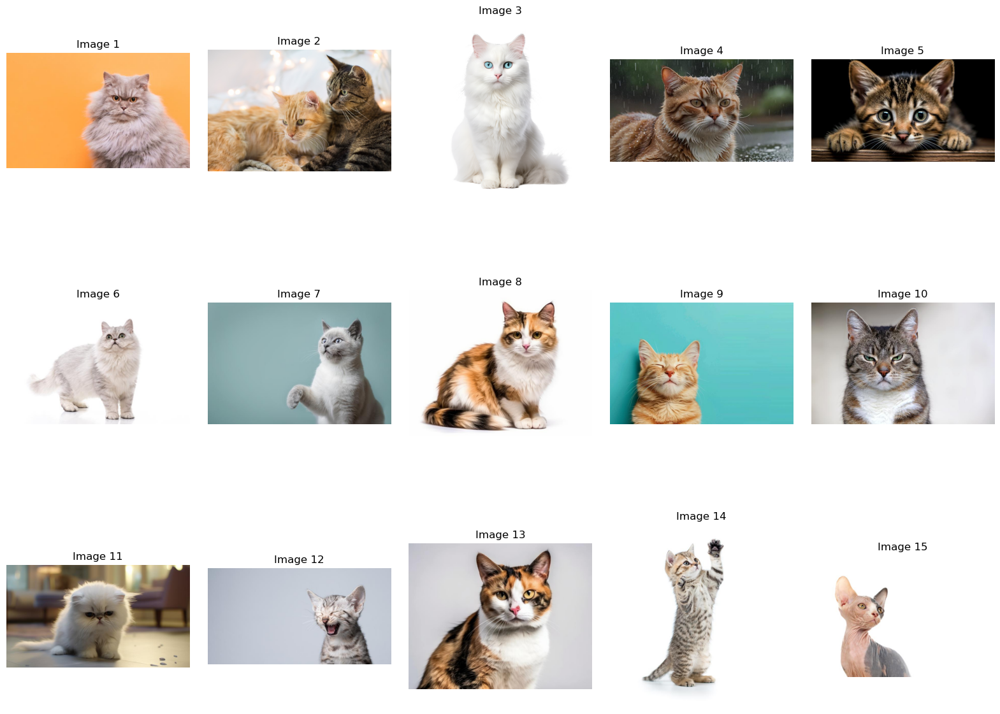

In [4]:
from utils.utils import plot_images

# Set the folder path
cats_dir = 'data/multimodal_embeddings_images/cats'
plot_images(cats_dir)

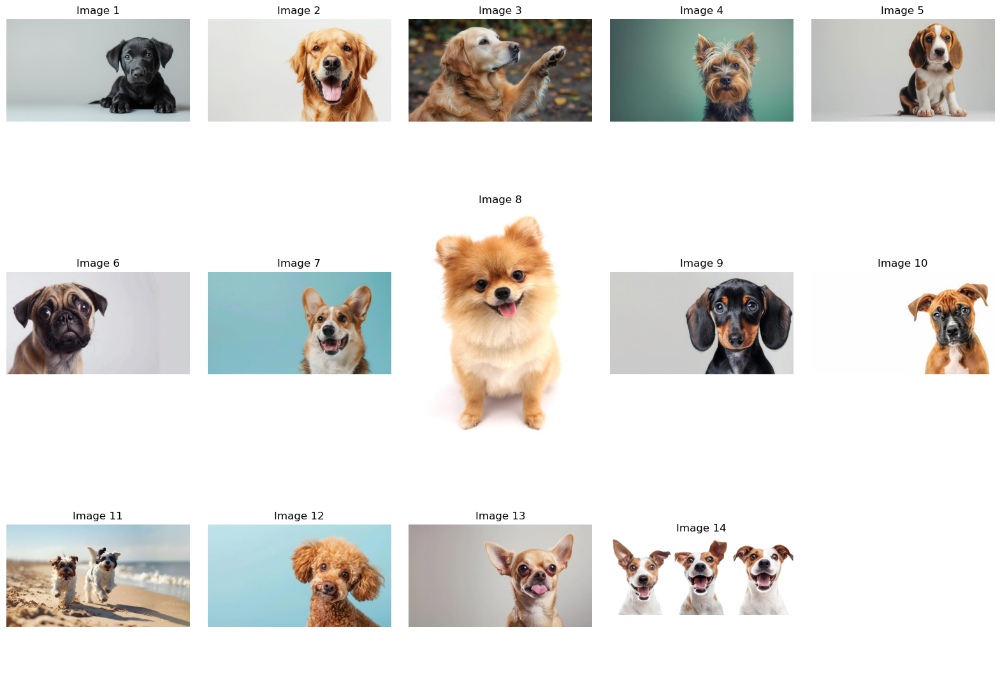

In [5]:
dogs_dir = 'data/multimodal_embeddings_images/dogs'
plot_images(dogs_dir)

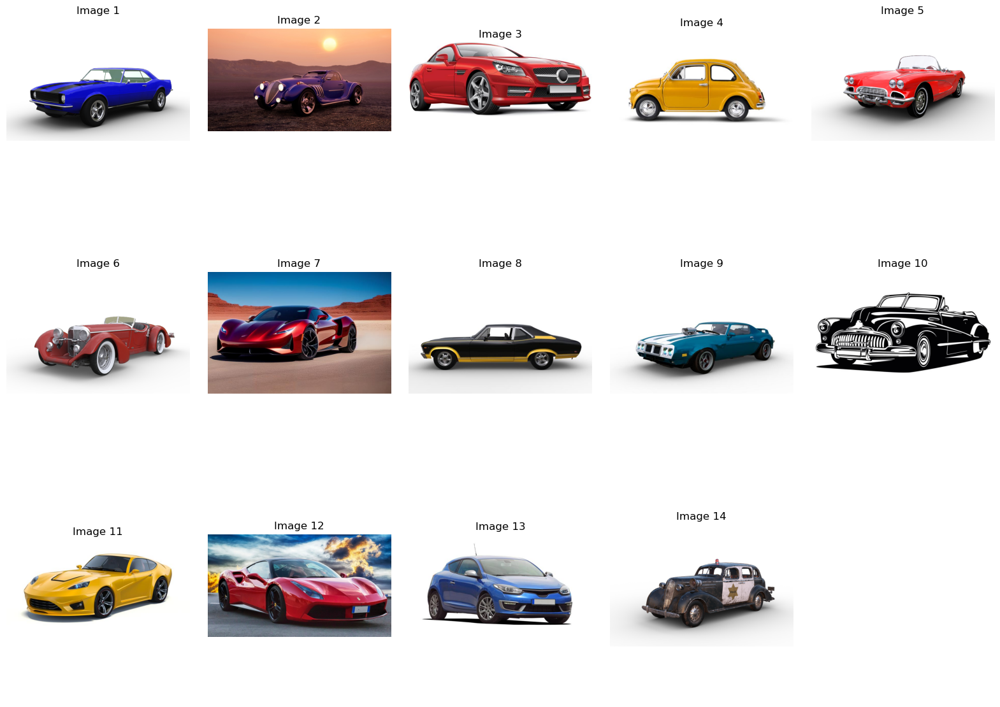

In [6]:
cars_dir = 'data/multimodal_embeddings_images/cars'
plot_images(cars_dir)

#### Process images

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p>This code processes images to meet the requirements of <b>Amazon's Titan Multimodal Embeddings model</b>. It ensures that:</p>

  <ol>
    <li>All images are within the <b>5MB size limit</b>.</li>
    <li>Image resolutions do not exceed <b>720x720 pixels</b>.</li>
  </ol>

  <p>The script scans a specified folder for image files (<b>jpg, png, jpeg</b>) and checks each against these criteria. If an image exceeds either the size or resolution limit, it is <b>resized while maintaining its aspect ratio</b>. This preprocessing step is crucial for <b>optimal performance</b> and compatibility with the embedding model, preventing potential errors or reduced accuracy due to oversized inputs.</p>
</div>


In [7]:
from utils.utils import process_images
process_images(cats_dir)
process_images(dogs_dir)
process_images(cars_dir)
process_images("data/multimodal_embeddings_images/test")

AdobeStock_243573741.jpeg is already compliant.
AdobeStock_189794291.jpeg is already compliant.
AdobeStock_631073219.png is already compliant.
AdobeStock_817089646.jpeg is already compliant.
AdobeStock_613832751.jpeg is already compliant.
AdobeStock_395474981.jpeg is already compliant.
AdobeStock_298968444.jpeg is already compliant.
AdobeStock_593895766.jpeg is already compliant.
AdobeStock_755937287.jpeg is already compliant.
AdobeStock_68330331.jpeg is already compliant.
AdobeStock_613832762.jpeg is already compliant.
AdobeStock_270079831.jpeg is already compliant.
AdobeStock_593895576.jpeg is already compliant.
AdobeStock_74353859.jpeg is already compliant.
AdobeStock_310383534.jpeg is already compliant.
AdobeStock_840547324.jpeg is already compliant.
AdobeStock_840553448.jpeg is already compliant.
AdobeStock_732659702.jpeg is already compliant.
AdobeStock_840555503.jpeg is already compliant.
AdobeStock_840547162.jpeg is already compliant.
AdobeStock_840554037.jpeg is already compli

### Generate `embeddings` of all the images

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p>To make images compatible with the <b>Amazon Titan multimodal embeddings model</b>, they need to be converted into <b>base64-encoded strings</b>. The <code>base64.b64encode()</code> function is used to convert this binary data into a base64-encoded byte string. Then, the byte string is decoded into a <b>UTF-8 string</b> using the <code>decode('utf8')</code> method.</p>

  <p>This resulting base64-encoded string represents the image data in a text format that can be easily transmitted and processed by the <b>Titan model</b>. By converting images to this format, we ensure that the model can accept and process the image data consistently, regardless of the original file format or size. This approach allows for seamless integration of image data into the model's input pipeline, enabling it to <b>generate embeddings</b> for various types of images efficiently.</p>
</div>


In [8]:
# Generate embeddings of all images
cats_embeddings, dogs_embeddings, cars_embeddings = [], [], []

cats_images = [os.path.join(cats_dir, file) for file in os.listdir(cats_dir) if file.endswith(('.jpg', '.png', 'jpeg'))]
dogs_images = [os.path.join(dogs_dir, file) for file in os.listdir(dogs_dir) if file.endswith(('.jpg', '.png', 'jpeg'))]
cars_images = [os.path.join(cars_dir, file) for file in os.listdir(cars_dir) if file.endswith(('.jpg', '.png', 'jpeg'))]

for path in cats_images:
    with open(path, 'rb') as f:
        image = base64.b64encode(f.read()).decode('utf8')
    cats_embeddings.append(generate_multimodal_embeddings(image=image))

for path in dogs_images:
    with open(path, 'rb') as f:
        image = base64.b64encode(f.read()).decode('utf8')
    dogs_embeddings.append(generate_multimodal_embeddings(image=image))

for path in cars_images:
    with open(path, 'rb') as f:
        image = base64.b64encode(f.read()).decode('utf8')
    cars_embeddings.append(generate_multimodal_embeddings(image=image))

cats_embeddings = np.array(cats_embeddings)
dogs_embeddings = np.array(dogs_embeddings)
cars_embeddings = np.array(cars_embeddings)

### Reduce the `dimension` for plotting



<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p>The <code>reduce_dimensionality</code> function employs <b>Principal Component Analysis (PCA)</b> to transform high-dimensional data into a <b>lower-dimensional space</b>, specifically reducing <b>384-dimensional vectors</b> to <b>2 dimensions</b> for visualization purposes.</p>

  <p>The function first <b>standardizes the input data</b> to ensure all features are on the same scale. It then applies <b>PCA</b>, setting the number of components to 2. This projection effectively compresses the 384-dimensional data into 2 dimensions while preserving as much of the original representation as possible.</p>

  <p>The resulting <b>2D representation</b> allows for easier visualization and analysis of the embedding's structure and relationships.</p>
</div>



In [9]:
from utils.utils import reduce_dimensionality

full_array = np.concatenate((cats_embeddings, cars_embeddings, dogs_embeddings))
trained_pca = reduce_dimensionality(full_array)

Let's used the trained PCA model to process the embeddings

In [10]:
reduced_cats_embeddings = trained_pca.transform(cats_embeddings)
reduced_dogs_embeddings = trained_pca.transform(dogs_embeddings)
reduced_cars_embeddings = trained_pca.transform(cars_embeddings)

### Visualize `Image Embeddings`

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p>In this section, we <b>visualize the embeddings</b> generated for each group of data: <b>vehicles, cats,</b> and <b>dogs</b>, and observe how they are represented on a plot.</p>

  <p>We should find that images of the same entity are <b>clustered together</b> and each group's cluster is <b>distant from other clusters</b>.</p>
</div>


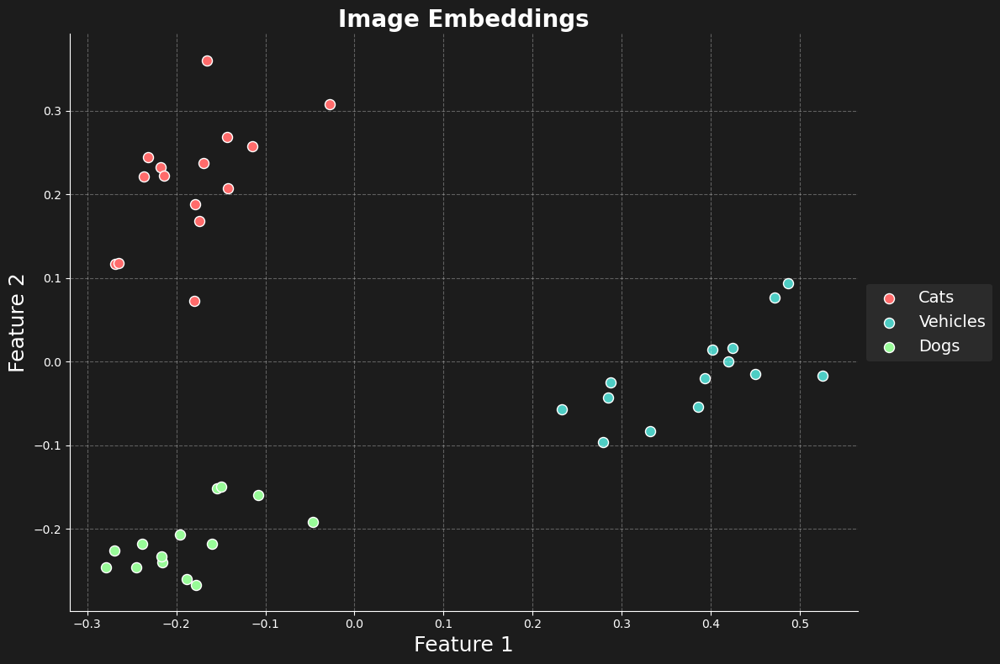

In [11]:
from utils.utils import plot_scatter_plot

# Produce a dict for plotting
full_data = {}

full_data["Cats"] = reduced_cats_embeddings
full_data["Vehicles"] = reduced_cars_embeddings
full_data["Dogs"] = reduced_dogs_embeddings

plot_scatter_plot(title= "Image Embeddings", full_data=full_data, new_data=[])


### Analyze new data using `multimodal embeddings`

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p>Let's see how a <b>previously unseen image</b> is represented by the embedding model. In this example, we will use an image of a <b>car's outline</b>. While it is evident that the image is that of a car, this image is significantly different from the ones we plotted before.</p>

  <p>Let's observe if the <b>embedding model</b> is able to represent this image as being <b>similar to other images of cars</b>.</p>
</div>


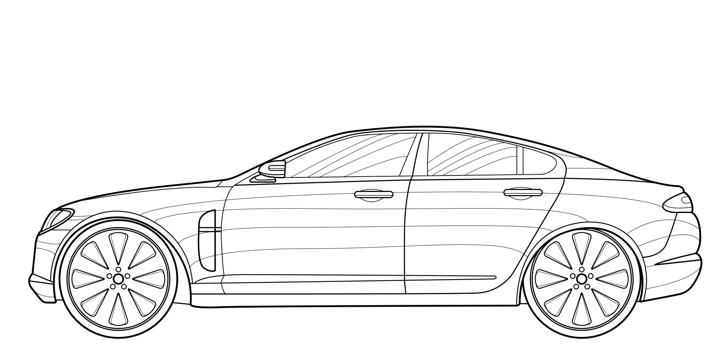

In [12]:
new_car = 'data/multimodal_embeddings_images/test/outline_car.jpeg'
display.Image(new_car, width=500, height=300)

In [13]:
with open(new_car, 'rb') as f:
    image = base64.b64encode(f.read()).decode('utf8')
new_car_embeddings = generate_multimodal_embeddings(image=image)
reduced_new_car_embeddings = trained_pca.transform(np.array(new_car_embeddings).reshape(1,-1))

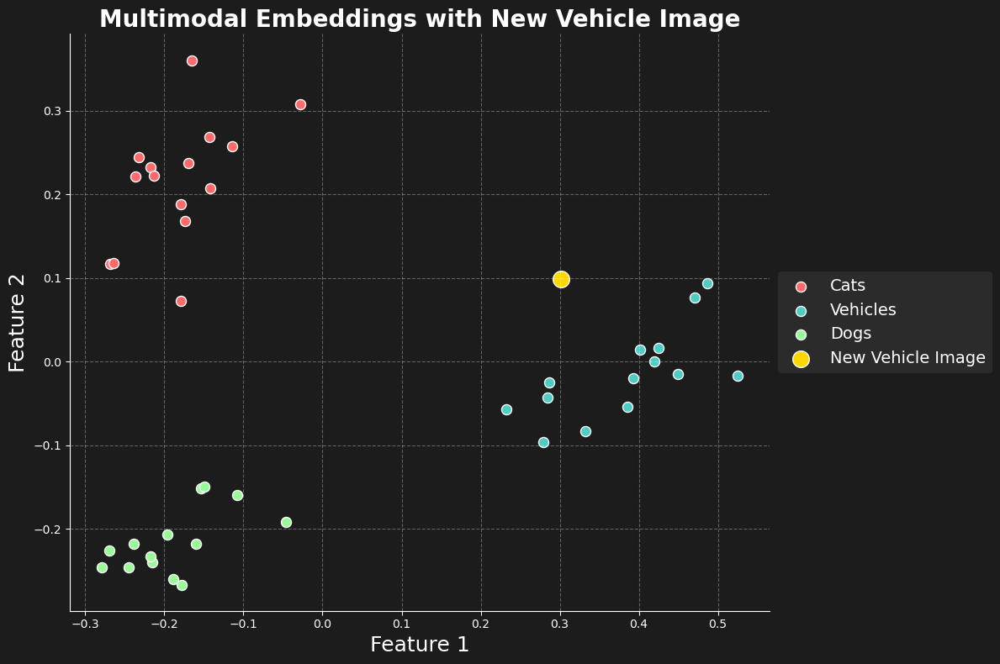

In [14]:
new_data = {}
new_data["New Vehicle Image"] = reduced_new_car_embeddings

plot_scatter_plot(title= "Multimodal Embeddings with New Vehicle Image", full_data=full_data, new_data=new_data)

Let's try the same with another example. Here, we have a picture of an animated cat which is, again, significantly differnet than the images of cats used before. Let's analyze the embeddings with this image.

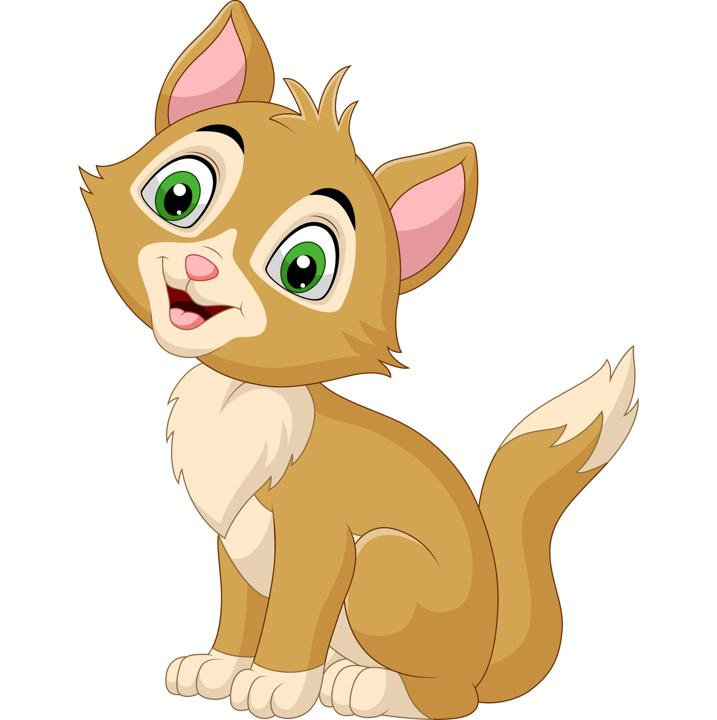

In [15]:
new_cat = 'data/multimodal_embeddings_images/test/animated_cat.jpeg'
display.Image(new_cat, width=300, height=300)

In [16]:
with open(new_cat, 'rb') as f:
    image = base64.b64encode(f.read()).decode('utf8')
new_cat_embeddings = generate_multimodal_embeddings(image=image)
reduced_new_cat_embeddings = trained_pca.transform(np.array(new_cat_embeddings).reshape(1,-1))

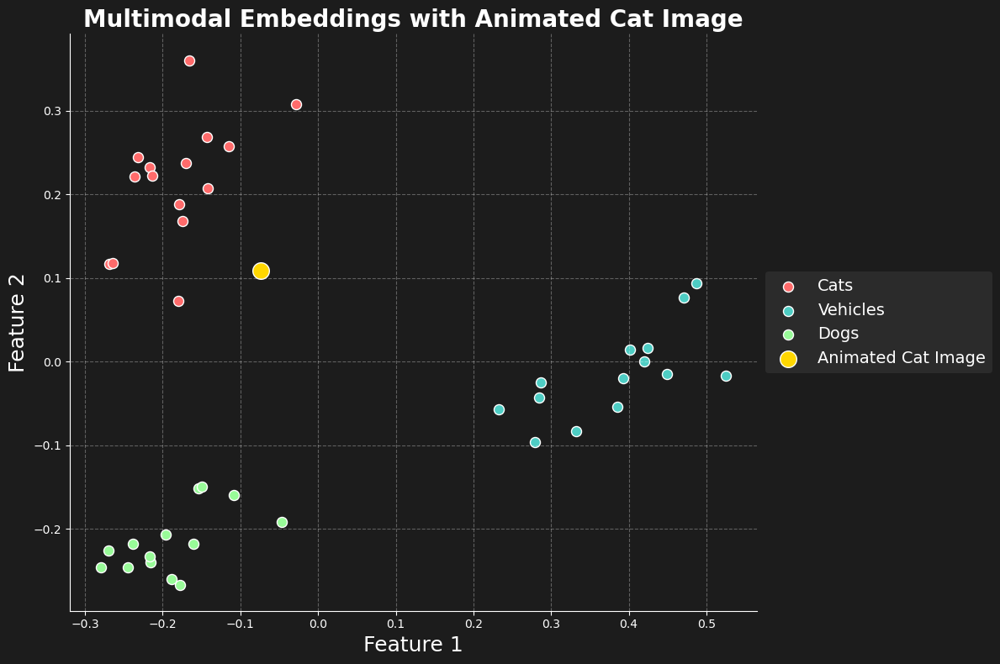

In [17]:
new_data = {}
new_data["Animated Cat Image"] = reduced_new_cat_embeddings

plot_scatter_plot(title= "Multimodal Embeddings with Animated Cat Image", full_data=full_data, new_data=new_data)

We can observe that the embedding model was able to represent the new image of the car and the cat well as they are located close to the clusters of cars and cats respectively. We can now explore how multimodal embeddings unify representations across modalities by observing how embeddings of text queries are represented on the same plot. 

Let's start with a text stating the make and model of a car.

In [18]:
car_text = "Audi Q4 e-tron"
car_text_embeddings = generate_multimodal_embeddings(prompt=car_text)
reduced_car_text_embeddings = trained_pca.transform(np.array(car_text_embeddings).reshape(1,-1))

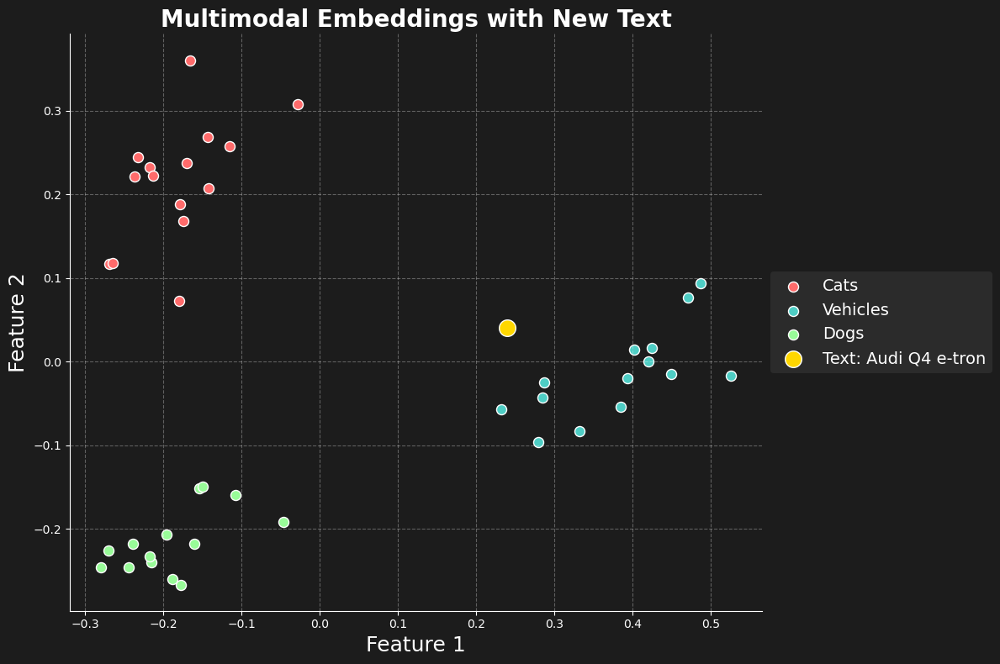

In [19]:
new_data = {}
new_data[f"Text: {car_text}"] = reduced_car_text_embeddings

plot_scatter_plot(title= "Multimodal Embeddings with New Text", full_data=full_data, new_data=new_data)

Let's observe another example. The text query in this example is that of a breed of cat. 

In [20]:
cat_text = "Sphynx Cat"
cat_text_embeddings = generate_multimodal_embeddings(prompt=cat_text)
reduced_cat_text_embeddings = trained_pca.transform(np.array(cat_text_embeddings).reshape(1,-1))

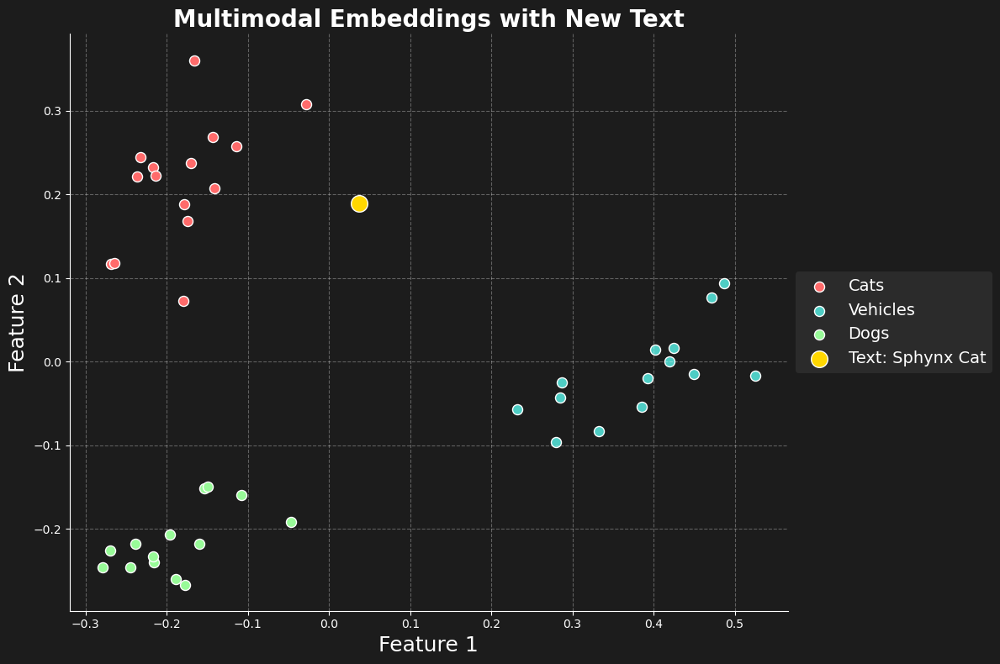

In [21]:
new_data = {}
new_data[f"Text: {cat_text}"] = reduced_cat_text_embeddings

plot_scatter_plot(title= "Multimodal Embeddings with New Text", full_data=full_data, new_data=new_data)

Let's observe all the new data points in a single plot along with the images of cats, vehicles and dogs we analyzed before.

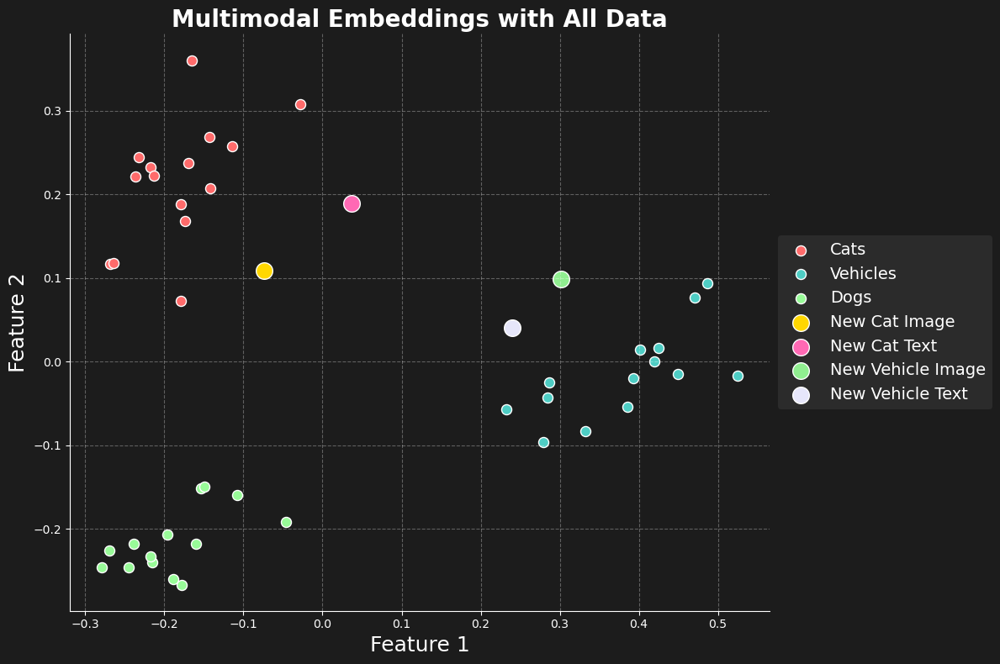

In [22]:
from utils.utils import plot_scatter_plot

# Produce a dict for plotting
full_data = {}

full_data["Cats"] = reduced_cats_embeddings
full_data["Vehicles"] = reduced_cars_embeddings
full_data["Dogs"] = reduced_dogs_embeddings

new_data = {}
new_data["New Cat Image"] = reduced_new_cat_embeddings
new_data["New Cat Text"] = reduced_cat_text_embeddings
new_data["New Vehicle Image"] = reduced_new_car_embeddings
new_data["New Vehicle Text"] = reduced_car_text_embeddings

plot_scatter_plot(title= "Multimodal Embeddings with All Data", full_data=full_data, new_data=new_data)


#### Compound images

Let's pause for a fun challenge. Following is an image of a cat and a dog riding in a car. It contains all three categories from the example before. Let's observe how this image will be represented in the plot.

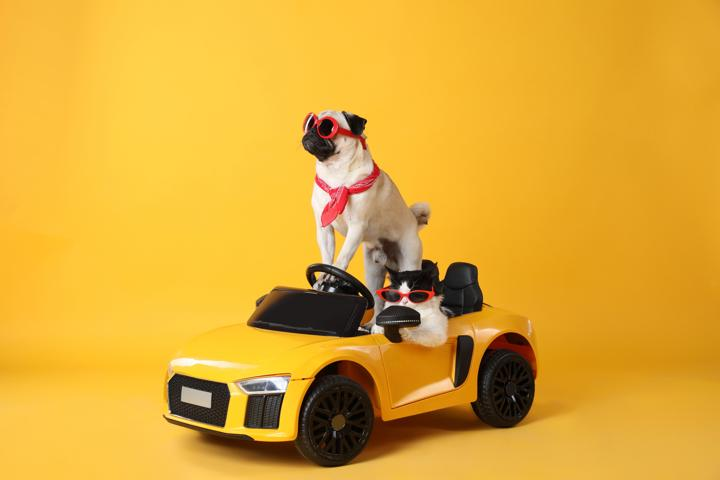

In [23]:
compound_image = 'data/multimodal_embeddings_images/test/car_dog_cat.jpeg'
display.Image(compound_image, width=800, height=400)

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p>We have observed how new <b>text or image data</b> compiles with the overall pattern exhibited by the embeddings. Now, let's try to observe how a <b>compound image with multiple elements</b> is represented by the embedding model.</p>

  <p>Lets try to write the code to <b>plot the embeddings</b> of the new image.</p>
</div>


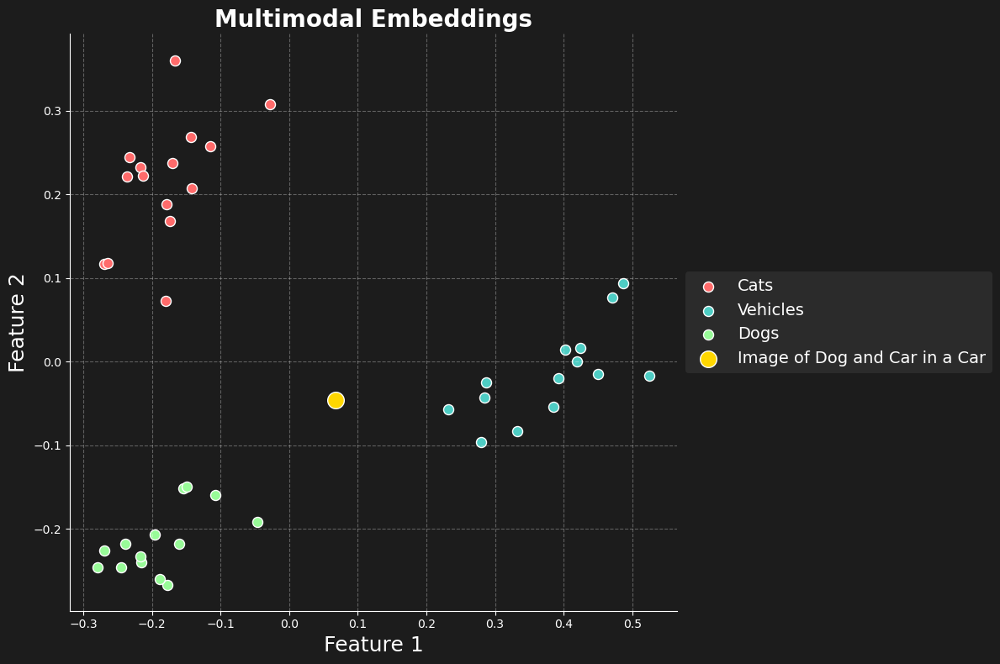

In [24]:
from utils.utils import plot_scatter_plot

with open(compound_image, 'rb') as f:
    image = base64.b64encode(f.read()).decode('utf8')
compound_image_embeddings = generate_multimodal_embeddings(image=image)
reduced_compound_image_embeddings = trained_pca.transform(np.array(compound_image_embeddings).reshape(1,-1))

# Produce a dict for plotting
full_data = {}

full_data["Cats"] = reduced_cats_embeddings
full_data["Vehicles"] = reduced_cars_embeddings
full_data["Dogs"] = reduced_dogs_embeddings

new_data = {}
new_data["Image of Dog and Car in a Car"] = reduced_compound_image_embeddings

plot_scatter_plot(title= "Multimodal Embeddings", full_data=full_data, new_data=new_data)

### Multimodal Search

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p>One of the key advantages of <b>multimodal embeddings</b> is their ability to capture <b>semantic relationships</b> across different modalities. Multimodal embeddings also facilitate <b>cross-modal retrieval</b> and <b>similarity search tasks</b>, which we will discuss in this lab. By projecting different data types into the same embedding space, it becomes possible to perform operations like <b>finding images that match a text description</b> or identifying captions that best describe a given image. This capability has numerous applications in areas such as <b>content recommendation, information retrieval,</b> and <b>multimedia analysis</b>.</p>

  <p>Furthermore, multimodal embeddings can enhance the performance of various <b>machine learning tasks</b> by leveraging complementary information from different modalities. For example, in <b>sentiment analysis</b>, combining textual features with visual cues from images can lead to more accurate predictions. Similarly, in <b>medical diagnosis</b>, integrating patient records with medical imaging data can provide a more holistic view for decision-making.</p>

  <p>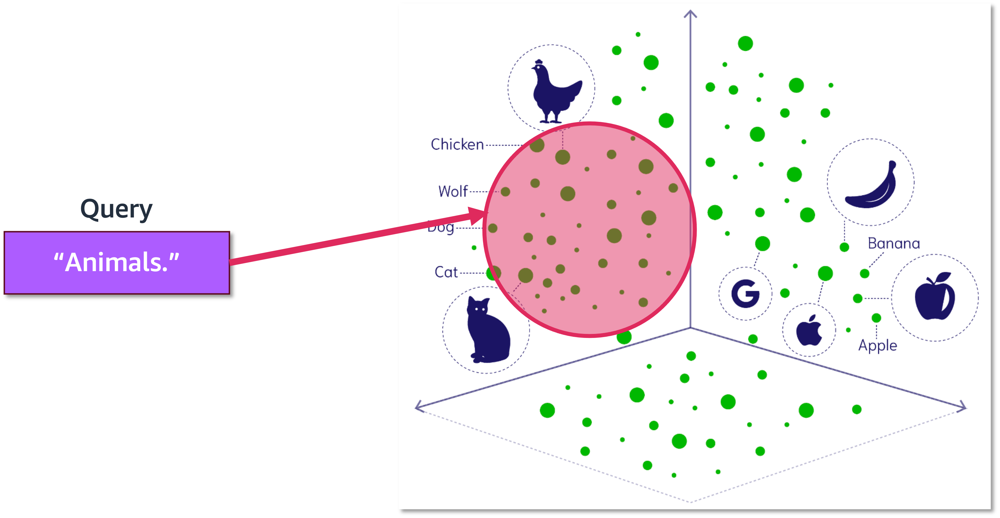</p>

  <p>Let's load a <b>product catalogue dataset</b> containing the text description of the product along with the corresponding image path.</p>
</div>


In [25]:
# Reading the products
df = pd.read_csv("data/dataset.csv")

# Display the data
pd.set_option('display.max_colwidth', None)
df.head()

,idx,text,image_path
0,0,"ROVSUN Ice Maker Machine Countertop, Make 44lbs Ice in 24 Hours, Compact & Portable Ice Maker with Ice Basket for Home, Office, Kitchen, Bar (Silver)",data/multimodal_search_images/idx_0.jpg
1,1,"HANSGO Egg Holder for Refrigerator, Deviled Eggs Dispenser Egg Storage Stackable Plastic Egg Containers Hold ups to 10 Eggs",data/multimodal_search_images/idx_1.jpg
2,2,"Clothes Dryer Drum Slide, General Electric, Hotpoint, WE1M333, WE1M504 Brand new dryer drum slide, replaces General Electric, Hotpoint, RCA, WE1M333, WE1M504.",data/multimodal_search_images/idx_2.jpg
3,3,"154567702 Dishwasher Lower Wash Arm Assembly for Kenmore Electrolux Dishwasher Bottom Lower Spray Arm 5304518927, AP6810011,154567701… MODEL NUMBER:154567702 Dishwasher Lower Wash Arm Assembly. This part is Replaces: AP6810011, 154567702, 5304507175, 154567701, 154335802, 154414201, 154496901, 154496902, 154550002,5304518927,735873135992. Fix Symptoms: When your dishwasher shows the following symptoms: Not cleaning dishes properly, Leaking, Noisy, Not draining.",data/multimodal_search_images/idx_3.jpg
4,4,Whirlpool W10918546 Igniter Whirlpool Igniter,data/multimodal_search_images/idx_4.jpg


Bowsers Donut Bed, X-Small, Ivory Sheepskin Our team of in-house designers ensure our beds reflect the latest trends in home decor. Our original, stylish and practical designs have become the gold standard in the industry. Bowsers beds are manufactured in Canada, allowing us to maintain a superior standard for quality and workmanship. Our beds are designed with zippered covers for easy care. We use only the highest quality materials, such as YKK zippers used in the luggage industry, high memory virgin polyester fiber and Eco-Tex Certified upholstery grade fabrics. Inner Cushion: machine wash and dry as is on cool setting. Tufting prevents fiber from shifting or clumping. Outer Cover: Unzip cover and remove bolster. Rezip cover and wash on cool setting. Hand wash inner bolster only.


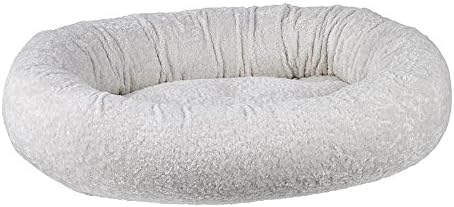

In [26]:
im = Image.open(df.loc[42]['image_path'])
print(df.loc[42]['text'])
im.show()

AirPods Case, Leather Portable Protective Cover Carrying Case for AirPods Charging Case (Blue) 1.Choose high-quality imported materials In the selection of materials, we all use environmentally friendly imported materials.The leather is tough, wearable and breathable. It keeps natural leather breathable, moisture absorption, soft, wear-resistant and comfortable. 2.Fine Sewing thread When you really use the genuine leather Case for Airpods you will find that our sewing thread is very delicate, we use the top sewing master to replace the sewing machine. 3.Precise Openings We adhere to the concept of environmental protection and conservation, and strive not to waste every inch of materials. 4.Bold color matching Accord with the young people's aesthetic now, contracted and not simple, serious and nifty, reveal individual character. 5.Customized Service


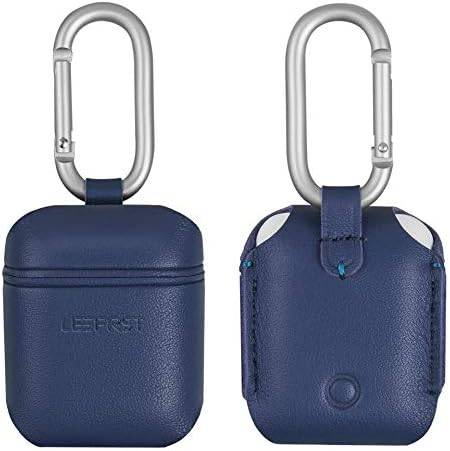

In [27]:
im = Image.open(df.loc[256]['image_path'])
print(df.loc[256]['text'])
im.show()

### Create embeddings

Let's convert each text-image pair in the dataset into a single embedding vector using Amazon Titan  Multimodal enbeddings model through Amazon Bedrock.

In [28]:
embedding_vector_dimension = 384
embeddings = []

for index, row in tqdm(df.iterrows(), total=df.shape[0], desc="Generating embeddings"):
    with open(row['image_path'], 'rb') as f:
        image = base64.b64encode(f.read()).decode('utf8')
    embeddings.append(generate_multimodal_embeddings(prompt=row['text'], image=image, output_embedding_length=embedding_vector_dimension))

Generating embeddings: 100%|██████████| 567/567 [01:22<00:00,  6.88it/s]


<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p>In this section, we will use <b><a href="https://faiss.ai/index.html" target="_blank">FAISS</a></b> (Facebook AI Similarity Search), a library for efficient similarity search and clustering of dense vectors.</p>

  <p>We will create a <b><a href="https://www.pinecone.io/learn/series/faiss/faiss-tutorial/#IndexFlatL2" target="_blank">FlatIndex</a></b> which measures the <b>L2 (Euclidean) distance</b> between all given points, comparing our query vector with the vectors loaded into the index. We will discuss more about indices in the next module.</p>
</div>


In [29]:
np.array(embeddings).shape

(567, 384)

In [30]:
# Create FAISS Index
index = faiss.IndexFlatL2(embedding_vector_dimension)
index.reset() # Clear any pre-existing index
index.add(np.array(embeddings, dtype=np.float32))

### Search using text

Let's try to search and retrieve products using a text query. We will search using the `nearest neighbors` algorithm.

In [31]:
# Search query
search_prompt = 'gift card'

# Generate an embedding of the query
search_prompt_embedding = generate_multimodal_embeddings(prompt=search_prompt,output_embedding_length=embedding_vector_dimension)

# Retrieve 'K' results
K = 5
distances, result = index.search(np.array(search_prompt_embedding, dtype=np.float32).reshape(1,-1), k=K)

Let's observe the retrieved results and the distance score representing how similar the product is to the query.

In [32]:
df_result = df.loc[result.flatten()]
df_result['distance'] = distances.flatten()

df_result

,idx,text,image_path,distance
469,472,Nordstrom Gift Card,data/multimodal_search_images/idx_472.jpg,0.564706
558,561,Starbucks Gift Card,data/multimodal_search_images/idx_561.jpg,0.569240
496,499,"Amazon.com Gift Cards Amazon.com Gift Cards are the perfect way to give them exactly what they're hoping for--even if you don't know what it is. Amazon.com Gift Cards are redeemable for millions of items storewide, and never expire.",data/multimodal_search_images/idx_499.jpg,0.595520
467,470,"Google Play Gift Card Google Play gift codes give you access to the latest entertainment. It's easy to find something you'll love, whether you're into music, movies, TV, books, magazines, apps, or games. With no credit card required, Play gift codes let you enjoy your favorite songs, movies, and more on screens of all sizes across Android, iOS, and the web.",data/multimodal_search_images/idx_470.jpg,0.609491
500,503,"Apple Gift Card - App Store, iTunes, iPhone, iPad, AirPods, MacBook, accessories and more Product description tbd",data/multimodal_search_images/idx_503.jpg,0.613867


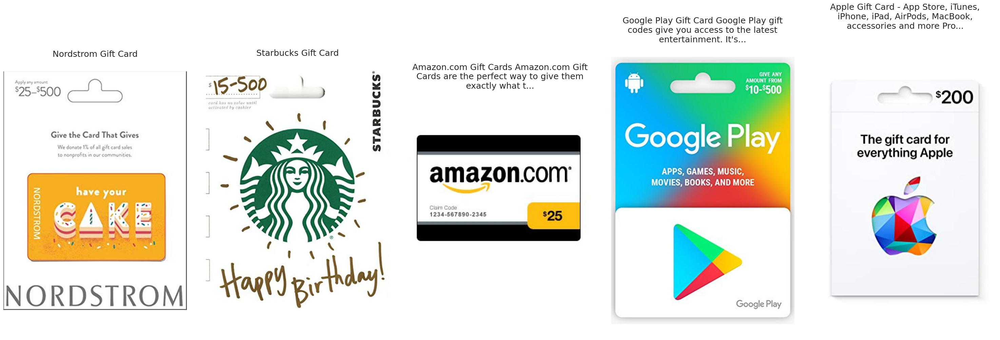

In [33]:
from utils.utils import plot_results

#. Plot the product images
plot_results(df.loc[result.flatten()])

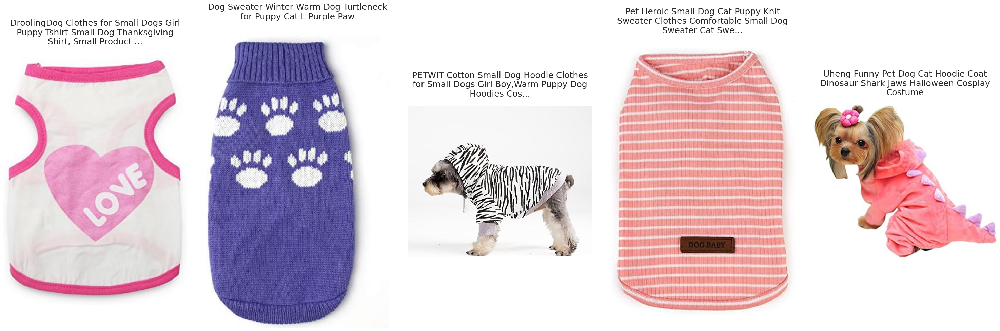

In [34]:
text_prompt = 'dog sweater'

K = 5

search_prompt_embedding = generate_multimodal_embeddings(prompt=text_prompt,output_embedding_length=embedding_vector_dimension)

distances, result = index.search(np.array(search_prompt_embedding, dtype=np.float32).reshape(1,-1), k=K)

df_result = df.loc[result.flatten()]
df_result['distance'] = distances.flatten()

plot_results(df.loc[result.flatten()])

### Search using Images

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p><b>Image search</b> is another search method. In this case, we only provide an image of what we are searching. The extracted <b>image embeddings</b> are used to find the most <b>similar products</b>.</p>
</div>


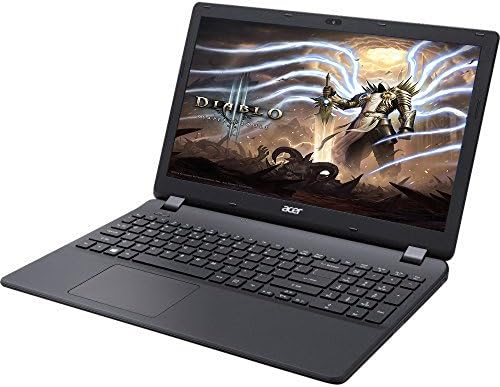

In [35]:
laptop_image = "data/query_images/query_image.jpg"
Image.open(laptop_image)

In [36]:
# Convert image to base64 before generating embeddings
with open(laptop_image, 'rb') as f:
    image = base64.b64encode(f.read()).decode('utf8')
laptop_image_embedding = generate_multimodal_embeddings(image=image,output_embedding_length=embedding_vector_dimension)

K = 5
distances, result = index.search(np.array(laptop_image_embedding, dtype=np.float32).reshape(1,-1), k=K)

In [37]:
df_result = df.loc[result.flatten()]
df_result['distance'] = distances.flatten()

df_result

,idx,text,image_path,distance
221,223,"Acer Aspire High Performance 15.6 inch HD Laptop PC, Intel Core i5-7200U Dual-Core, 6GB RAM, 128GB SSD (boot) + 1TB HDD, Bluetooth, WIFI, Windows 10 Home",data/multimodal_search_images/idx_223.jpg,0.533203
181,182,"Gateway 15.6"" FHD Ultra Slim Budget Notebook, Intel Pentium Processor(4-Core, up to 3.1 GHz), 4GB RAM, 128GB Storage, Precision Touchpad, HDMI, Type-C Windows 10S, Microsoft 365 1 Year, Charcoal Black Processor: Intel® Pentium® Silver N5030 Processor (1.10GHz, Up to 3.10GHz, 4M Cache) Display: 15.6” LCD IPS Display, (1920 x 1080) Operating system: Windows 10 Home 64-bit English in S mode Video Card: Intel UHD Graphics 605 Memory: 4 GB DDR4 RAM Hard drive Size: 128GB eMMC Wireless: Wi-Fi5 (802.11ac) for speeds up to 3x faster than 802.11n Ports: HDMI Output x 1, USB Type-C x 1, USB 3.0 x 2 Battery: Up to 8.5 hours of battery life Dimensions: 14.8” x 9.6” x 0.8” Inches Weight: 4.2lbs Color: Black ENERGY STAR Certified: Yes How to switch s mode to windows 10 1. On your PC running Windows 10 in S mode, open Settings > Update & Security > Activation. 2. In the Switch to Windows 10 Home or Switch to Windows 10 Pro section, select Go to the Store. (If you also see an ""Upgrade your edition of Windows"" section, be careful not to click the ""Go to the Store"" link that appears there.) 3. On the Switch out of S mode (or similar) page that appears in the Microsoft Store, select the Get button. After you see a confirmation message on the page, you'll be able to install apps from outside of the Microsoft Store.",data/multimodal_search_images/idx_182.jpg,0.709383
281,284,"CUK HP Pavilion 17 Touch Gaming Notebook (i7-7700HQ, 16GB DDR4 RAM, 1TB SSHD, NVIDIA GTX 1050 4GB, 17.3"" Full HD Touchscreen, Windows 10) Best Laptop for Media Students Photographers Photoshop",data/multimodal_search_images/idx_284.jpg,0.745191
223,225,"GIGABYTE AERO 16 XE5-16"" 4K/UHD+ Samsung AMOLED, Intel Core i7-12700H, NVIDIA GeForce RTX 3070 Ti Laptop GPU 8GB GDDR6, 32GB DDR5 RAM, 2TB SSD,Win11 Pro Laptop (AERO 16 XE5-73US948HP) NVIDIA 30 Series GPU: NVIDIA GeForce RTX 3070 Ti Laptop GPU 8GB GDDR6, Boost Clock 1035 MHz, Maximum Graphics Power 105 W, Intel 12th Gen Ready: 12th Gen Intel Core i7-12700H (2.3GHz~4.7GHz), DDR5 Ready: DDR5 4800 16GB*2, 2x DDR5 Slots - Max 64GB, 2TB Storage, Cutting-Edge Display: 16"" Thin Bezel 4K/UHD+ 3840x2400 Samsung AMOLED Display, VESA DisplayHDR 500, 100% DCI-P3, Next Gen Interface: Windows 11 Pro, Intel Wi-Fi 6E AX210 (Gig+), Bluetooth V5.2, AERO Hub: External Adaptor with HDMI, miniDP, USB 3.1 Type-A, RJ45, Dynamic Audio: DTS:X Ultra Audio Technology, Built-in Microphone, 2x 2W Speakers, I/O: 2x Thunderbolt 4, 1x USB 3.2 Gen2 (Type-C), 1x 3.5mm Audio Combo Jack, 1x DC-in Jack",data/multimodal_search_images/idx_225.jpg,0.787713
217,219,"13-15.6 Inch Laptop Sleeve Case Women Men Shoulder Bag Briefcase Messenger Bag Portable Handbag 15-15.6 Inch Laptop Computer Case Cover Sleeve Shoulder Strap Bag Internal Dimensions: 15.94 x 11.81 x 1.2 inch (40.5 mm x 300 mm x 30 mm). Compatible With: Acer: Acer Aspire E 15 E5-575 , E5-575G / Acer Aspire E 15,Aspire 5 / Acer Predator Helios 300 / Acer Nitro 5 / Acer Flagship CB3-532 / Acer Chromebook 15 CB5-571 , C910 , CB3-531,Acer Swift 3 Laptop 15.6 "" , 2018 Newest Acer 15.6” ,Acer Aspire VX 15 Gaming Laptop,Acer 15.6"" Chromebook and etc. ASUS: ASUS ZenBook Pro UX501VW 15.6"" / ASUS K501UX 15.6 inch / ASUS VivoBook F510UA / ASUS X550ZA / F555LA / X555LA / F555UA / X550ZA / X555YA / K501LX / X540LA / X555YA / Q504UA / Q503 / ASUS X550 / X55C-DS31 / X551 / X553 / F551 / F553 / K501 / K501UW / GL552VW / X551MA and etc. HP: HP 15-F222WM 15.6"" , 15-F211WM / HP Pavilion 15.6"" / HP Premium 15.6"" / HP Flagship 15.6"" / 15-BW011DX / 15-BS013DX / HP ProBook 450 455 650 465 / HP Envy x360 15.6"" / HP Spectre x360 2-in-1 15.6"" / EliteBook / HP OMEN 15.6"" Laptop / ZBook 15 and etc. Lenovo: 15.6"" Lenovo IdeaPad Y700 / Lenovo Yoga 720 15.6"" / Legion 

/home/sagemaker-user/multimodal-rag/utils/utils.py:46: UserWarning: Glyph 65306 (\N{FULLWIDTH COLON}) missing from font(s) DejaVu Sans.
  bbox = t.get_window_extent(renderer=fig.canvas.get_renderer())
/home/sagemaker-user/multimodal-rag/utils/utils.py:46: UserWarning: Glyph 128154 (\N{GREEN HEART}) missing from font(s) DejaVu Sans.
  bbox = t.get_window_extent(renderer=fig.canvas.get_renderer())


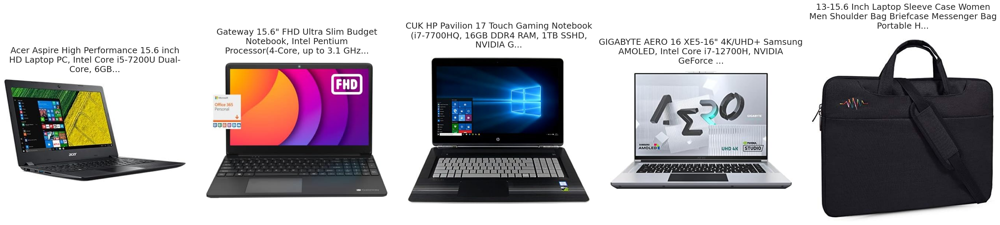

In [38]:
plot_results(df.loc[result.flatten()])

### Search using both text and image(s)

<div style="background-color:#f0f8ff; padding: 15px; border-radius: 10px; border-left: 6px solid #4682B4;">
  <p>Lastly, we can use both the <b>image</b> and <b>text description</b> to search for similar products. Assume you have the following text description and image for a <b>dog leash product</b> provided. <b>Let's solve a small challenge here.</b></p>
</div>


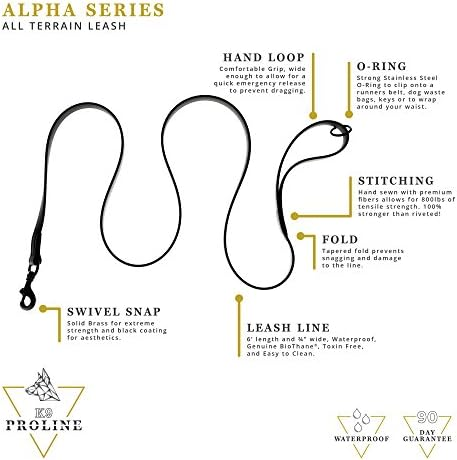

In [39]:
dog_leash_text = "Dog Leash"
dog_leash_image = "data/query_images/dog_leash.jpg"
Image.open(dog_leash_image) 

So far, we have used either a text-only query or an image-only query to retrieve similar products. In this challenge, try to retrive the products using both a text query and an image.

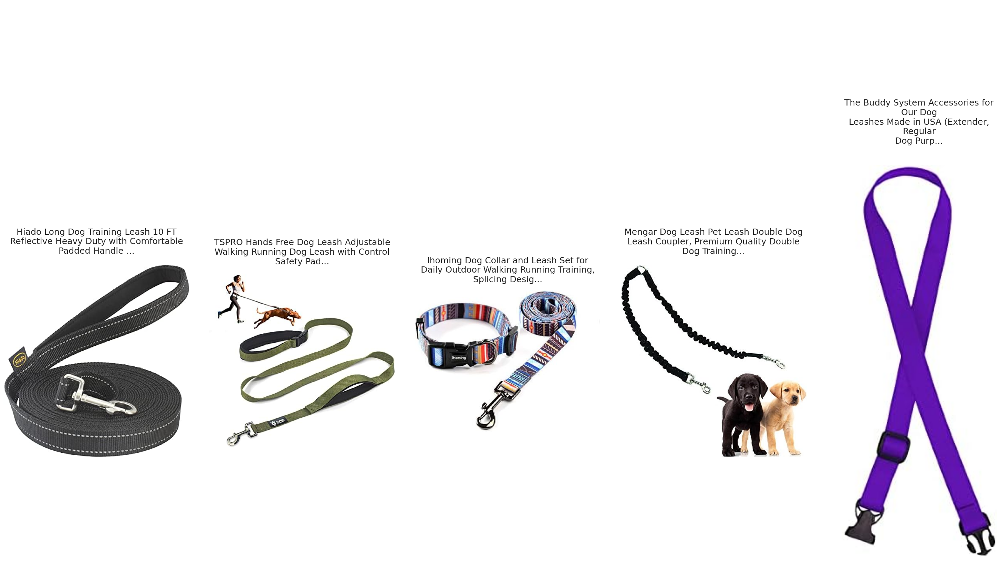

In [40]:
with open(dog_leash_image, 'rb') as f:
    image = base64.b64encode(f.read()).decode('utf8')
dog_leash_image_embedding = generate_multimodal_embeddings(image=image,output_embedding_length=embedding_vector_dimension)

distances, result = index.search(np.array(dog_leash_image_embedding, dtype=np.float32).reshape(1,-1), k=K)

df_result = df.loc[result.flatten()]
df_result['distance'] = distances.flatten()

plot_results(df.loc[result.flatten()])